# Tumor segmentation

In [1]:
!nvidia-smi

Fri Apr  7 08:58:05 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   58C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Load data

In [2]:
# mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

%cd '/content/drive/MyDrive/PythonWorkspace/Labs/DA_2023'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/PythonWorkspace/Labs/DA_2023


In [3]:
from glob import glob
import pandas as pd
from sklearn.model_selection import train_test_split

# create dataframe - https://www.kaggle.com/datasets/mateuszbuda/lgg-mri-segmentation
def create_df(data_dir):
    images_paths = []
    masks_paths = glob(f'{data_dir}/*/*_mask*')

    for i in masks_paths:
        images_paths.append(i.replace('_mask', ''))

    df = pd.DataFrame(data= {'images_paths': images_paths, 'masks_paths': masks_paths})

    return df

# split dataframe into train, valid, test
def split_df(df):
    train_df, dummy_df = train_test_split(df, train_size= 0.8)
    valid_df, test_df = train_test_split(dummy_df, train_size= 0.5)

    return train_df, valid_df, test_df

In [4]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# create normalized image generator
def create_gens(df, aug_dict):
    img_size = (256, 256)
    batch_size = 40

    img_gen = ImageDataGenerator(**aug_dict)
    msk_gen = ImageDataGenerator(**aug_dict)

    image_gen = img_gen.flow_from_dataframe(df, x_col='images_paths', class_mode=None, color_mode='rgb', target_size=img_size,
                                            batch_size=batch_size, save_to_dir=None, save_prefix='image', seed=1)
    mask_gen = msk_gen.flow_from_dataframe(df, x_col='masks_paths', class_mode=None, color_mode='grayscale', target_size=img_size,
                                            batch_size=batch_size, save_to_dir=None, save_prefix= 'mask', seed=1)
    gen = zip(image_gen, mask_gen)

    for (img, msk) in gen:
        img = img / 255
        msk = msk / 255
        msk[msk > 0.5] = 1
        msk[msk <= 0.5] = 0

        yield (img, msk)

In [5]:
import cv2
import matplotlib.pyplot as plt

# display the part of the dataset
def show_images(images, masks):
    plt.figure(figsize=(12, 12))
    for i in range(25):
        plt.subplot(5, 5, i+1)
        img_path = images[i]
        mask_path = masks[i]

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_path)
        
        plt.imshow(image)
        plt.imshow(mask, alpha=0.4)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

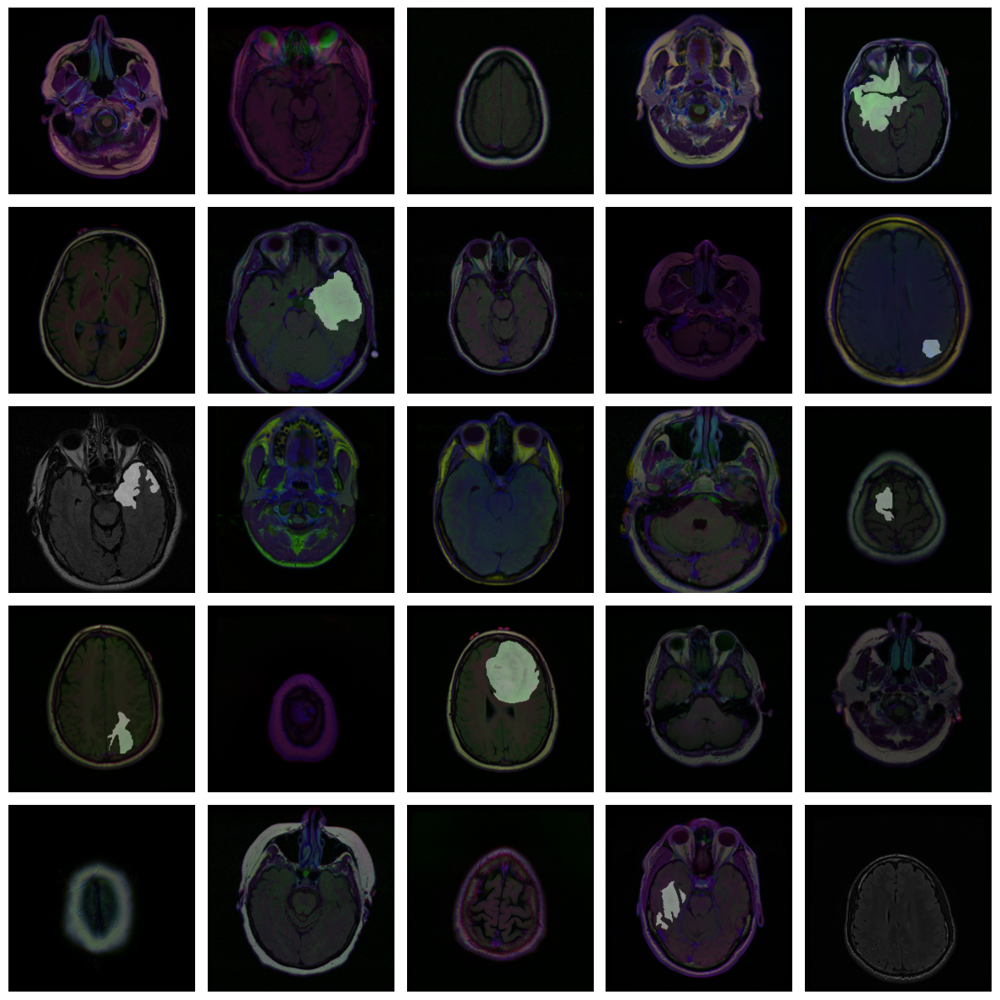

In [6]:
data_dir = './lgg-mri-segmentation/kaggle_3m'

df = create_df(data_dir)
train_df, valid_df, test_df = split_df(df)

# data augmentation
tr_aug_dict = dict(rotation_range=0.2,
                            width_shift_range=0.05,
                            height_shift_range=0.05,
                            shear_range=0.05,
                            zoom_range=0.05,
                            horizontal_flip=True,
                            fill_mode='nearest')

train_gen = create_gens(train_df, aug_dict=tr_aug_dict)
valid_gen = create_gens(valid_df, aug_dict={})
test_gen = create_gens(test_df, aug_dict={})

show_images(list(train_df['images_paths']), list(train_df['masks_paths']))

## Build the model

In [7]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Activation, BatchNormalization, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate

def unet_model(input_size=(256, 256, 3)):
    inputs = Input(input_size)

    # encoder
    conv1 = Conv2D(filters=64, kernel_size=(3, 3), padding="same")(inputs)
    bn1 = Activation("relu")(conv1)
    conv1 = Conv2D(filters=64, kernel_size=(3, 3), padding="same")(bn1)
    bn1 = BatchNormalization(axis=3)(conv1)
    bn1 = Activation("relu")(bn1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(bn1)

    conv2 = Conv2D(filters=128, kernel_size=(3, 3), padding="same")(pool1)
    bn2 = Activation("relu")(conv2)
    conv2 = Conv2D(filters=128, kernel_size=(3, 3), padding="same")(bn2)
    bn2 = BatchNormalization(axis=3)(conv2)
    bn2 = Activation("relu")(bn2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(bn2)

    conv3 = Conv2D(filters=256, kernel_size=(3, 3), padding="same")(pool2)
    bn3 = Activation("relu")(conv3)
    conv3 = Conv2D(filters=256, kernel_size=(3, 3), padding="same")(bn3)
    bn3 = BatchNormalization(axis=3)(conv3)
    bn3 = Activation("relu")(bn3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(bn3)

    conv4 = Conv2D(filters=512, kernel_size=(3, 3), padding="same")(pool3)
    bn4 = Activation("relu")(conv4)
    conv4 = Conv2D(filters=512, kernel_size=(3, 3), padding="same")(bn4)
    bn4 = BatchNormalization(axis=3)(conv4)
    bn4 = Activation("relu")(bn4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(bn4)

    conv5 = Conv2D(filters=1024, kernel_size=(3, 3), padding="same")(pool4)
    bn5 = Activation("relu")(conv5)
    conv5 = Conv2D(filters=1024, kernel_size=(3, 3), padding="same")(bn5)
    bn5 = BatchNormalization(axis=3)(conv5)
    bn5 = Activation("relu")(bn5)

    # decoder

    up6 = concatenate([Conv2DTranspose(512, kernel_size=(2, 2), strides=(2, 2), padding="same")(bn5), conv4], axis=3)
    conv6 = Conv2D(filters=512, kernel_size=(3, 3), padding="same")(up6)
    bn6 = Activation("relu")(conv6)
    conv6 = Conv2D(filters=512, kernel_size=(3, 3), padding="same")(bn6)
    bn6 = BatchNormalization(axis=3)(conv6)
    bn6 = Activation("relu")(bn6)

    up7 = concatenate([Conv2DTranspose(256, kernel_size=(2, 2), strides=(2, 2), padding="same")(bn6), conv3], axis=3)
    conv7 = Conv2D(filters=256, kernel_size=(3, 3), padding="same")(up7)
    bn7 = Activation("relu")(conv7)
    conv7 = Conv2D(filters=256, kernel_size=(3, 3), padding="same")(bn7)
    bn7 = BatchNormalization(axis=3)(conv7)
    bn7 = Activation("relu")(bn7)

    up8 = concatenate([Conv2DTranspose(128, kernel_size=(2, 2), strides=(2, 2), padding="same")(bn7), conv2], axis=3)
    conv8 = Conv2D(filters=128, kernel_size=(3, 3), padding="same")(up8)
    bn8 = Activation("relu")(conv8)
    conv8 = Conv2D(filters=128, kernel_size=(3, 3), padding="same")(bn8)
    bn8 = BatchNormalization(axis=3)(conv8)
    bn8 = Activation("relu")(bn8)

    up9 = concatenate([Conv2DTranspose(64, kernel_size=(2, 2), strides=(2, 2), padding="same")(bn8), conv1], axis=3)
    conv9 = Conv2D(filters=64, kernel_size=(3, 3), padding="same")(up9)
    bn9 = Activation("relu")(conv9)
    conv9 = Conv2D(filters=64, kernel_size=(3, 3), padding="same")(bn9)
    bn9 = BatchNormalization(axis=3)(conv9)
    bn9 = Activation("relu")(bn9)

    conv10 = Conv2D(filters=1, kernel_size=(1, 1), activation="sigmoid")(bn9)

    return Model(inputs=[inputs], outputs=[conv10])

In [8]:
from tensorflow.keras import backend as K

# create dice coefficient
def dice_coef(y_true, y_pred, smooth=100):
    y_true_flatten = K.flatten(y_true)
    y_pred_flatten = K.flatten(y_pred)

    intersection = K.sum(y_true_flatten * y_pred_flatten)
    union = K.sum(y_true_flatten) + K.sum(y_pred_flatten)
    return (2 * intersection + smooth) / (union + smooth)

# create dice loss
def dice_loss(y_true, y_pred, smooth=100):
    return -dice_coef(y_true, y_pred, smooth)

# create iou coefficient
def iou_coef(y_true, y_pred, smooth=100):
    intersection = K.sum(y_true * y_pred)
    sum = K.sum(y_true + y_pred)
    iou = (intersection + smooth) / (sum - intersection + smooth)
    return iou

In [9]:
from tensorflow.keras.optimizers import Adamax

# create the model
model = unet_model()
model.compile(Adamax(),
              loss=dice_loss,
              metrics=['accuracy', iou_coef, dice_coef])

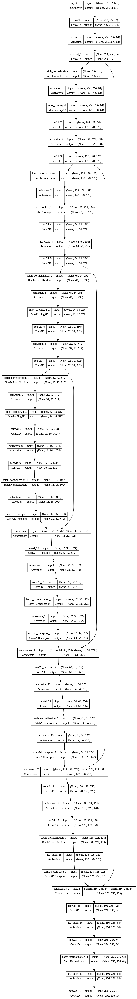

In [10]:
# plot the model
tf.keras.utils.plot_model(model, show_shapes=True)

## Train

In [11]:
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping, ModelCheckpoint
import math

epochs = 3 # 100
batch_size = 1024 # 64

# learning rate schedule
def lr_schedule(epoch):
    lr = 0.001
    if epoch > 5:
        lr *= 0.1
    return lr

callbacks = [ModelCheckpoint('unet.hdf5', verbose=0, save_best_only=True),
             LearningRateScheduler(lr_schedule),
             EarlyStopping(patience=3)]

# train loop
history = model.fit(train_gen,
                    steps_per_epoch=math.ceil(len(train_df) / batch_size),
                    epochs=epochs,
                    verbose=1,
                    callbacks=callbacks,
                    validation_data=valid_gen,
                    validation_steps=math.ceil(len(valid_df) / batch_size))

Found 3143 validated image filenames.
Found 3143 validated image filenames.
Epoch 1/3
4/4 [==============================] - ETA: 0s - loss: -0.0352 - accuracy: 0.6894 - iou_coef: 0.0180 - dice_coef: 0.0352 Found 393 validated image filenames.
Found 393 validated image filenames.
4/4 [==============================] - 233s 57s/step - loss: -0.0352 - accuracy: 0.6894 - iou_coef: 0.0180 - dice_coef: 0.0352 - val_loss: -0.0195 - val_accuracy: 0.3517 - val_iou_coef: 0.0099 - val_dice_coef: 0.0195 - lr: 0.0010
Epoch 2/3
4/4 [==============================] - 205s 68s/step - loss: -0.0596 - accuracy: 0.8189 - iou_coef: 0.0308 - dice_coef: 0.0596 - val_loss: -0.0192 - val_accuracy: 0.6326 - val_iou_coef: 0.0097 - val_dice_coef: 0.0192 - lr: 0.0010
Epoch 3/3
4/4 [==============================] - 216s 71s/step - loss: -0.0939 - accuracy: 0.8691 - iou_coef: 0.0494 - dice_coef: 0.0939 - val_loss: -0.0331 - val_accuracy: 0.0697 - val_iou_coef: 0.0169 - val_dice_coef: 0.0331 - lr: 0.0010


In [12]:
import numpy as np

# plot history of accuracy and losses
def plot_training(hist):
    tr_acc = hist.history['accuracy']
    tr_iou = hist.history['iou_coef']
    tr_dice = hist.history['dice_coef']
    tr_loss = hist.history['loss']

    val_acc = hist.history['val_accuracy']
    val_iou = hist.history['val_iou_coef']
    val_dice = hist.history['val_dice_coef']
    val_loss = hist.history['val_loss']

    index_acc = np.argmax(val_acc)
    acc_highest = val_acc[index_acc]
    index_iou = np.argmax(iou_coef)
    iou_highest = val_iou[index_iou]
    index_dice = np.argmax(dice_coef)
    dice_highest = val_dice[index_dice]
    index_loss = np.argmin(val_loss)
    val_lowest = val_loss[index_loss]

    Epochs = [i+1 for i in range(len(tr_acc))]

    acc_label = f'best epoch = {str(index_acc + 1)}'
    iou_label = f'best epoch = {str(index_iou + 1)}'
    dice_label = f'best epoch = {str(index_dice + 1)}'
    loss_label = f'best epoch = {str(index_loss + 1)}'

    plt.figure(figsize= (20, 20))
    plt.style.use('fivethirtyeight')

    # training accuracy
    plt.subplot(2, 2, 1)
    plt.plot(Epochs, tr_acc, 'r', label='Training Accuracy')
    plt.plot(Epochs, val_acc, 'g', label='Validation Accuracy')
    plt.scatter(index_acc + 1, acc_highest, s=150, c='blue', label=acc_label)
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # training iou
    plt.subplot(2, 2, 2)
    plt.plot(Epochs, tr_iou, 'r', label='Training IoU')
    plt.plot(Epochs, val_iou, 'g', label='Validation IoU')
    plt.scatter(index_iou + 1, iou_highest, s=150, c='blue', label=iou_label)
    plt.title('Training and Validation IoU Coefficient')
    plt.xlabel('Epochs')
    plt.ylabel('IoU')
    plt.legend()

    # training dice
    plt.subplot(2, 2, 3)
    plt.plot(Epochs, tr_dice, 'r', label='Training Dice')
    plt.plot(Epochs, val_dice, 'g', label='Validation Dice')
    plt.scatter(index_dice + 1, dice_highest, s=150, c='blue', label=dice_label)
    plt.title('Training and Validation Dice Coefficient')
    plt.xlabel('Epochs')
    plt.ylabel('Dice')
    plt.legend()

    # training loss
    plt.subplot(2, 2, 4)
    plt.plot(Epochs, tr_loss, 'r', label='Training loss')
    plt.plot(Epochs, val_loss, 'g', label='Validation loss')
    plt.scatter(index_loss + 1, val_lowest, s=150, c='blue', label=loss_label)
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout
    plt.show()

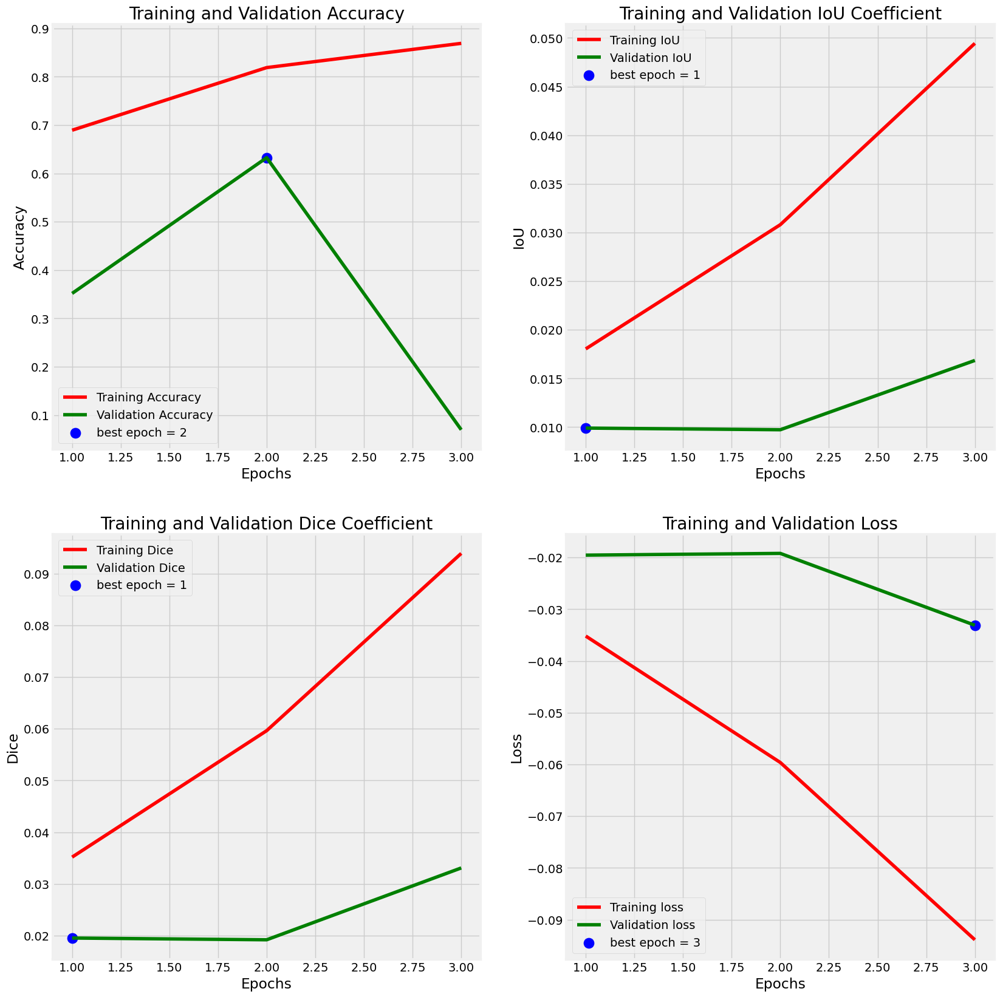

In [13]:
plot_training(history)

## Evaluation

In [14]:
test_steps = math.ceil(len(test_df) / batch_size)
test_score = model.evaluate(test_gen, steps=test_steps, verbose=1)

print("Test Loss:", test_score[0])
print("Test Accuracy:", test_score[1])
print("Test IoU:", test_score[2])
print("Test Dice:", test_score[3])

Found 393 validated image filenames.
Found 393 validated image filenames.
1/1 [==============================] - 1s 758ms/step - loss: -0.0160 - accuracy: 0.0528 - iou_coef: 0.0081 - dice_coef: 0.0160
Test Loss: -0.016047894954681396
Test Accuracy: 0.05277290195226669
Test IoU: 0.008120403625071049
Test Dice: 0.016047894954681396


## Prediction

1/1 [==============================] - 2s 2s/step


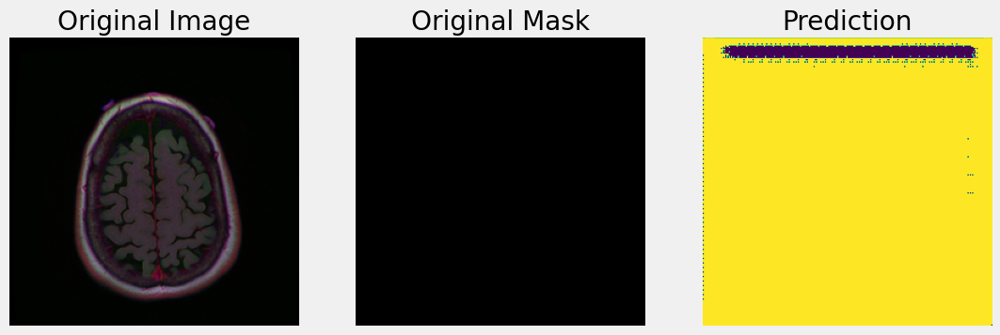

1/1 [==============================] - 0s 20ms/step


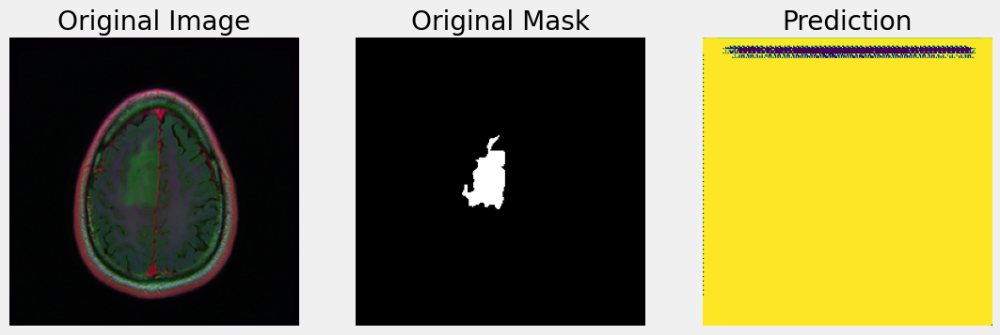

1/1 [==============================] - 0s 22ms/step


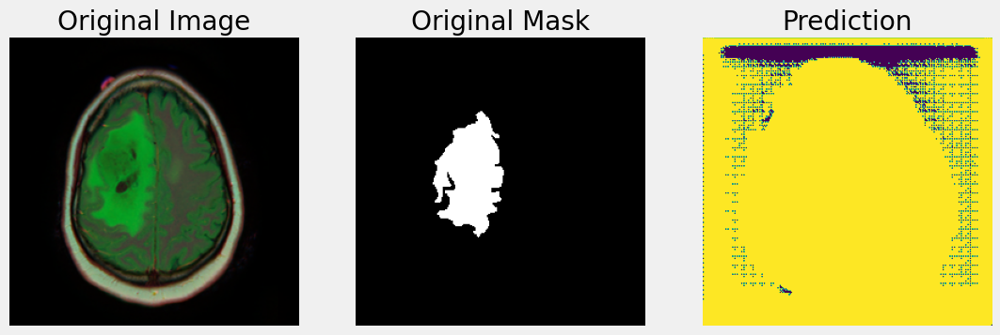

1/1 [==============================] - 0s 22ms/step


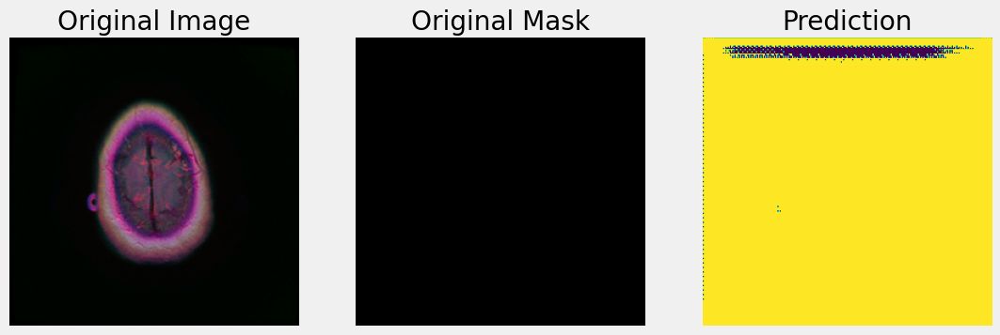

1/1 [==============================] - 0s 20ms/step


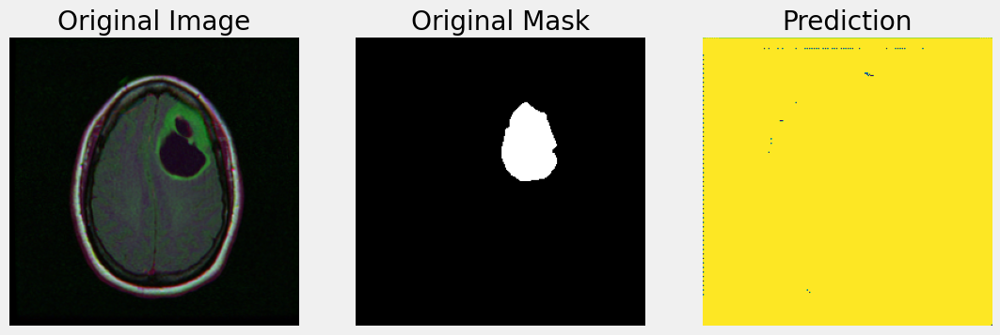

1/1 [==============================] - 0s 20ms/step


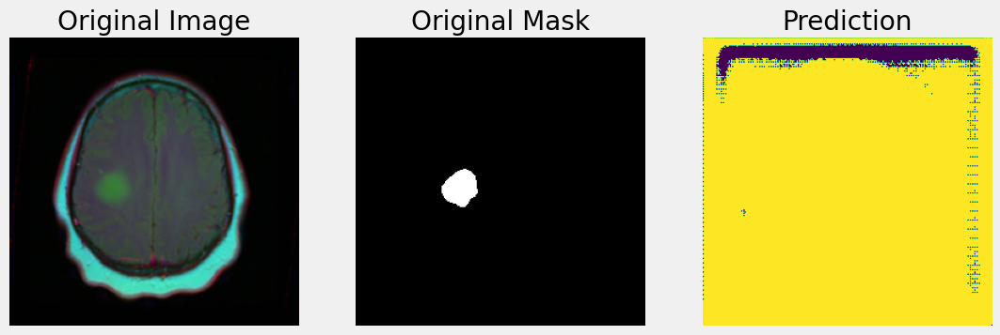

1/1 [==============================] - 0s 19ms/step


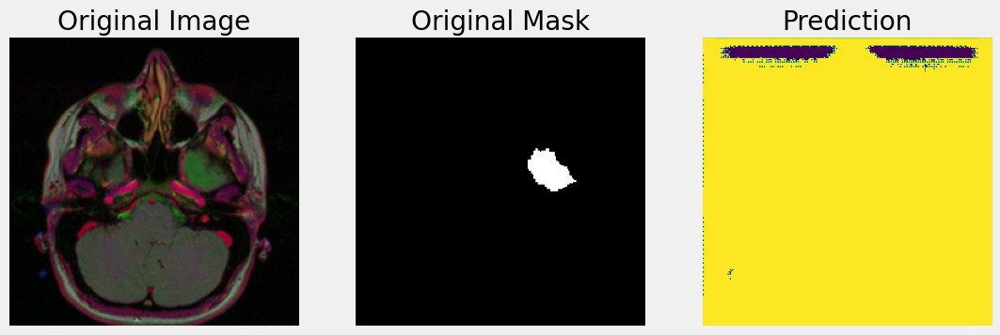

1/1 [==============================] - 0s 20ms/step


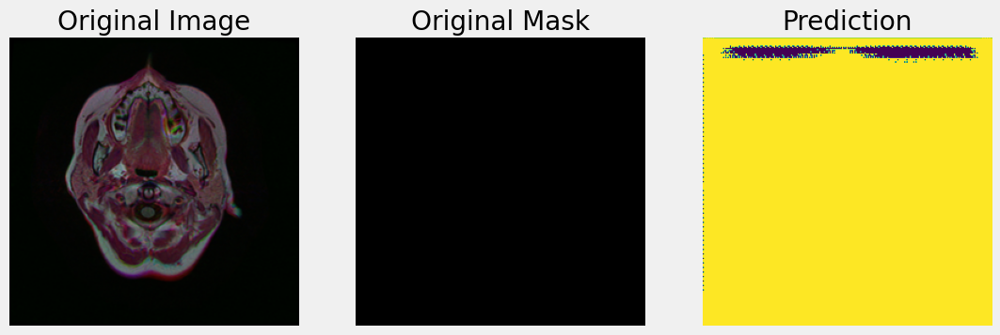

1/1 [==============================] - 0s 24ms/step


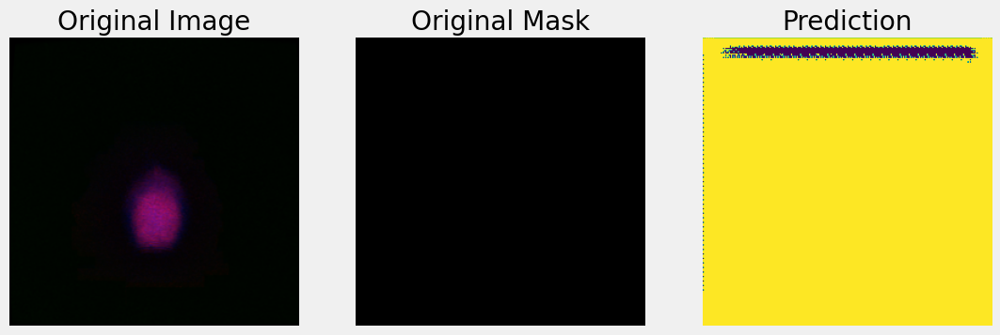

1/1 [==============================] - 0s 20ms/step


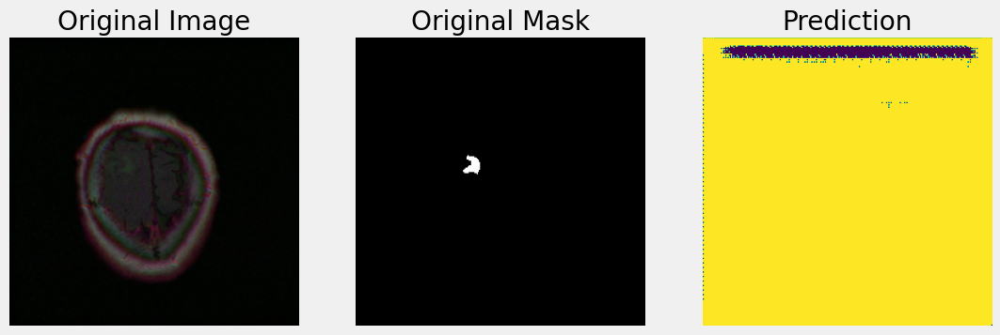

In [15]:
for _ in range(10):
    index = np.random.randint(1, len(test_df.index))
    img = cv2.imread(test_df['images_paths'].iloc[index])
    img = cv2.resize(img, (256, 256))
    img = img / 255
    img = img[np.newaxis, :, :, : ]

    predicted_img = model.predict(img)

    plt.figure(figsize=(12, 12))
    
    plt.subplot(1, 3, 1)
    plt.imshow(np.squeeze(img))
    plt.axis('off')
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(np.squeeze(cv2.imread(test_df['masks_paths'].iloc[index])))
    plt.axis('off')
    plt.title('Original Mask')

    plt.subplot(1, 3, 3)
    plt.imshow(np.squeeze(predicted_img) > 0.5)
    plt.title('Prediction')
    plt.axis('off')
    
    plt.show()

# Super Resolution

## Load data

In [16]:
from PIL import Image

def build_data(img_path):
    img = Image.open(img_path)
    img_array = np.array(img)
    cropped = tf.dtypes.cast(tf.image.random_crop(img_array / 255, (256, 256, 3)), tf.float32)
    lr = tf.image.resize(cropped, (128, 128))
    lr = tf.image.resize(lr, (256, 256), method=tf.image.ResizeMethod.BICUBIC)
    return lr, cropped

In [17]:
from tqdm import tqdm

data_dir = './lgg-mri-segmentation/kaggle_3m'

df = create_df(data_dir)
train_df, valid_df, test_df = split_df(df)

# create dataset
train_images = []
for i in tqdm(range(1000)):
    img_path = train_df.iloc[i]['images_paths']
    lr, cropped = build_data(img_path)
    train_images.append([lr, cropped])
train_images = np.array(train_images)

valid_images = []
for i in tqdm(range(100)):
    img_path = valid_df.iloc[i]['images_paths']
    lr, cropped = build_data(img_path)
    valid_images.append([lr, cropped])
valid_images = np.array(valid_images)

test_images = []
for i in tqdm(range(100)):
    img_path = test_df.iloc[i]['images_paths']
    lr, cropped = build_data(img_path)
    test_images.append([lr, cropped])
test_images = np.array(test_images)

100%|██████████| 100/100 [00:47<00:00,  2.11it/s]


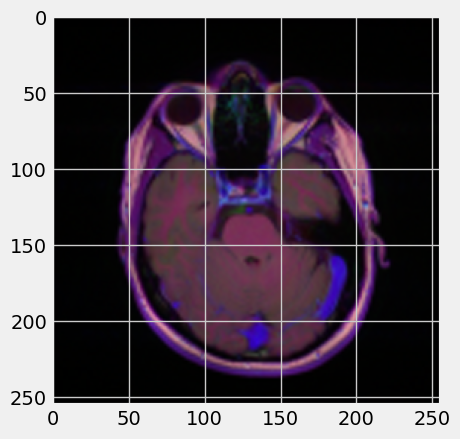

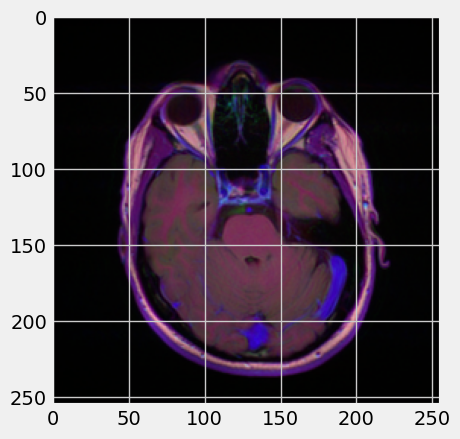

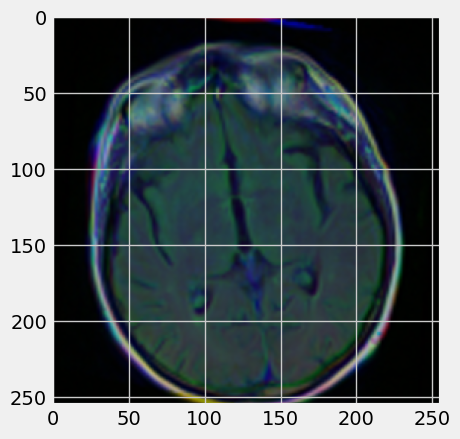

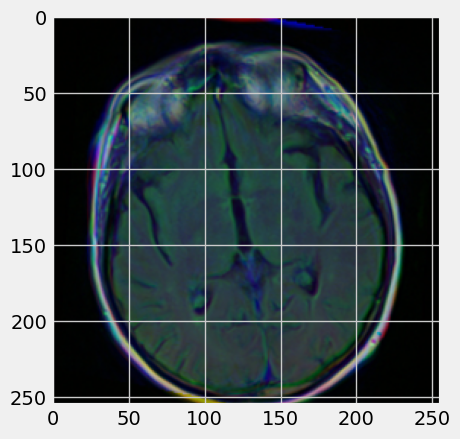

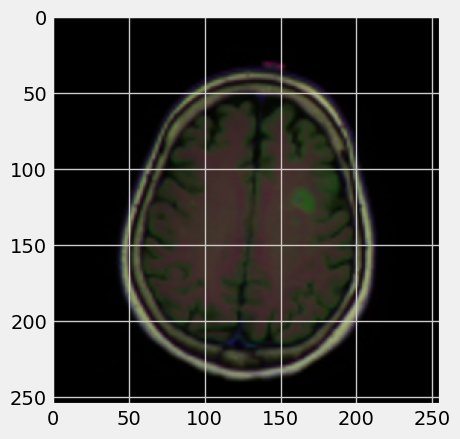

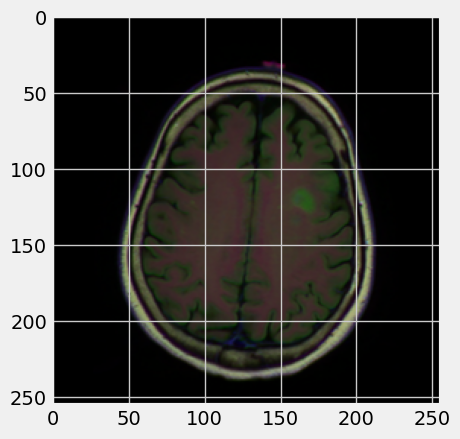

In [18]:
# display some images
for x in train_images[:3]:
    plt.imshow(x[0])
    plt.show()
    plt.imshow(x[1])
    plt.show()

## Build model

Hyperparams papers:

1.   https://arxiv.org/abs/1803.09820
2.   http://proceedings.mlr.press/v9/glorot10a/glorot10a.pdf


In [20]:
# define arch
def build_SRCNN_915(activation='relu', optimizer='adam'):
    SRCNN_915 = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(128, 9, padding='same', activation=activation, input_shape=(256, 256, 3)),
        tf.keras.layers.Conv2D(64, 1, padding='same', activation=activation),
        tf.keras.layers.Conv2D(3, 5, padding='same', activation=activation)
    ])

    # mse loss
    def pixel_mse_loss(y_true, y_pred):
        return tf.reduce_mean((y_true - y_pred) ** 2)

    # compile with given optimizer
    SRCNN_915.compile(optimizer=optimizer, loss=pixel_mse_loss)
    return SRCNN_915

# train loop
def train_SRCNN_915(SRCNN_915, train_images, valid_images, epochs=100, batch_size=64, callbacks=[]):
    history = SRCNN_915.fit(train_images[:, 0], train_images[:, 1],
                            steps_per_epoch=math.ceil(len(train_images) / batch_size),
                            epochs=epochs,
                            verbose=1,
                            callbacks=callbacks,
                            validation_data=(valid_images[:, 0], valid_images[:, 1]),
                            validation_steps=math.ceil(len(valid_images) / batch_size))
    return history

epochs = 20
batch_size = 40

# learning rate schedule
def lr_schedule(epoch):
    lr = 0.001
    if epoch > 5:
        lr *= 0.1
    return lr

callbacks = [ModelCheckpoint('srcnn.hdf5', verbose=0, save_best_only=True),
             LearningRateScheduler(lr_schedule),
             EarlyStopping(patience=3)]

# define hyperparameters to test
activations = ['tanh', 'relu']
optimizers = ['sgd', 'adam']

# iterate through hyperparameters and evaluate the model
results = []
for activation in activations:
    for optimizer in optimizers:
        print(f"Testing activation function: {activation}, optimizer: {optimizer}")
        SRCNN_915 = build_SRCNN_915(activation=activation, optimizer=optimizer)
        history = train_SRCNN_915(SRCNN_915, train_images, valid_images, epochs=epochs, batch_size=batch_size, callbacks=callbacks)
        val_loss = history.history['val_loss'][-1]
        results.append({'activation': activation, 'optimizer': optimizer, 'val_loss': val_loss})

results_df = pd.DataFrame(results)
results_df

Testing activation function: tanh, optimizer: sgd
Epoch 1/20
25/25 [==============================] - 22s 612ms/step - loss: 0.0160 - val_loss: 0.0115 - lr: 0.0010
Epoch 2/20
25/25 [==============================] - 9s 363ms/step - loss: 0.0113 - val_loss: 0.0084 - lr: 0.0010
Epoch 3/20
25/25 [==============================] - 9s 366ms/step - loss: 0.0085 - val_loss: 0.0066 - lr: 0.0010
Epoch 4/20
25/25 [==============================] - 9s 367ms/step - loss: 0.0069 - val_loss: 0.0055 - lr: 0.0010
Epoch 5/20
25/25 [==============================] - 9s 370ms/step - loss: 0.0059 - val_loss: 0.0048 - lr: 0.0010
Epoch 6/20
25/25 [==============================] - 9s 368ms/step - loss: 0.0052 - val_loss: 0.0044 - lr: 0.0010
Epoch 7/20
25/25 [==============================] - 9s 366ms/step - loss: 0.0050 - val_loss: 0.0044 - lr: 1.0000e-04
Epoch 8/20
25/25 [==============================] - 9s 366ms/step - loss: 0.0050 - val_loss: 0.0043 - lr: 1.0000e-04
Epoch 9/20
25/25 [===================

,activation,optimizer,val_loss
0,tanh,sgd,0.004058
1,tanh,adam,0.000275
2,relu,sgd,0.014902
3,relu,adam,0.000238


In [21]:
# plot history of loss
def plot_training(hist):
    tr_loss = hist.history['loss']
    val_loss = hist.history['val_loss']

    index_loss = np.argmin(val_loss)
    val_lowest = val_loss[index_loss]

    Epochs = [i+1 for i in range(len(tr_loss))]
    loss_label = f'best epoch = {str(index_loss + 1)}'

    plt.figure(figsize=(7, 7))
    plt.style.use('fivethirtyeight')

    plt.plot(Epochs, tr_loss, 'r', label='Training loss')
    plt.plot(Epochs, val_loss, 'g', label='Validation loss')
    plt.scatter(index_loss + 1, val_lowest, s=150, c='blue', label=loss_label)
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout
    plt.show()

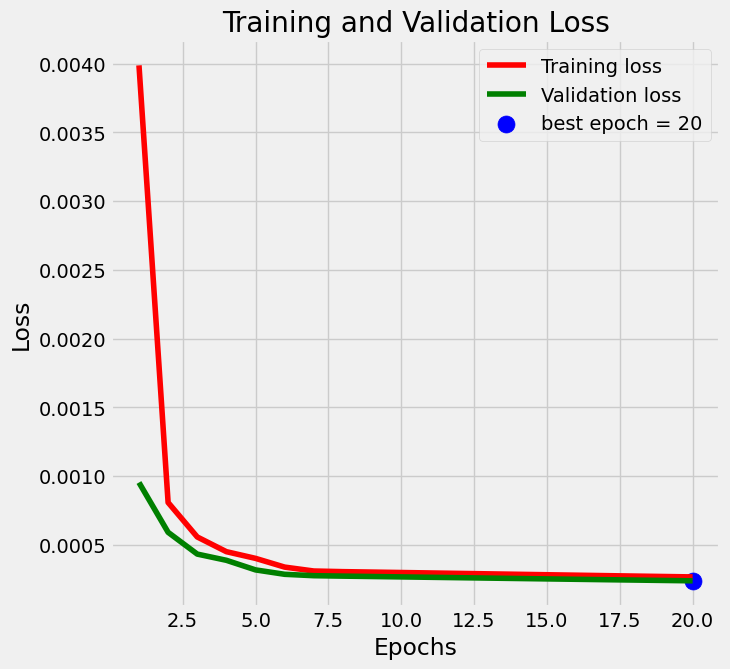

In [22]:
plot_training(history)

## Evaluation

In [23]:
test_steps = math.ceil(len(test_df) / batch_size)
test_score = SRCNN_915.evaluate(test_images[:, 0], test_images[:, 1], steps=test_steps, verbose=1)

print("Test Loss:", test_score)

10/10 [==============================] - 1s 29ms/step - loss: 2.6490e-04
Test Loss: 0.00026490495656616986


## Prediction

1/1 [==============================] - 0s 183ms/step


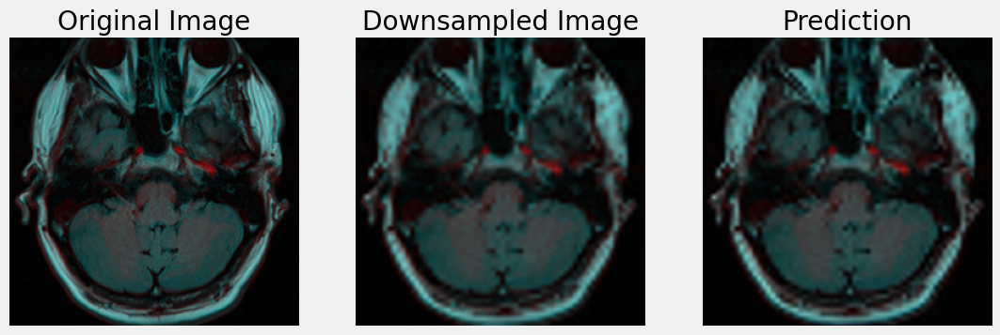

1/1 [==============================] - 0s 19ms/step


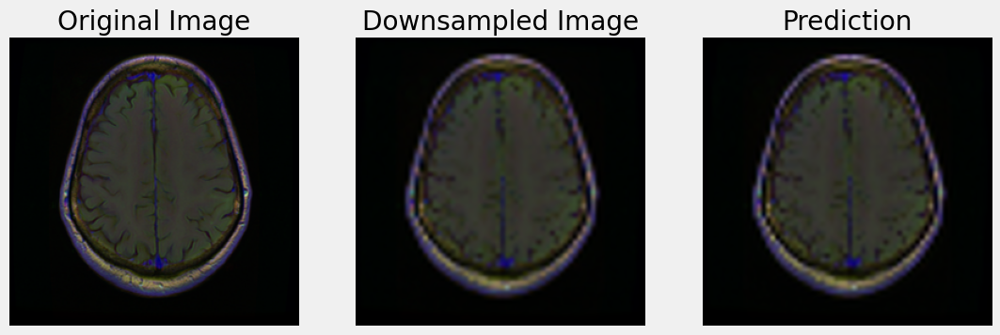

1/1 [==============================] - 0s 21ms/step


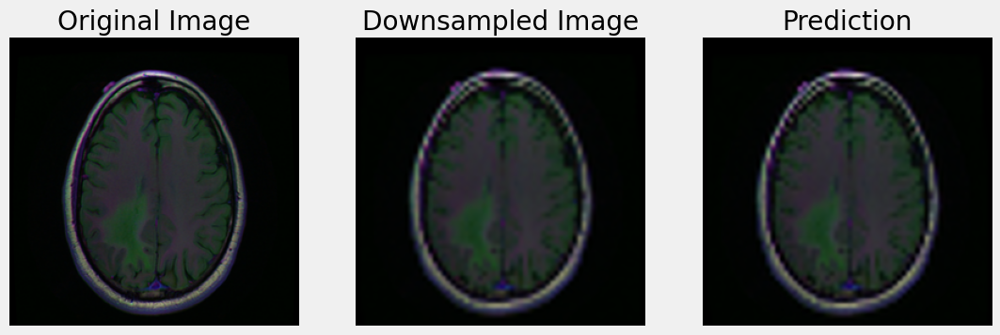

1/1 [==============================] - 0s 20ms/step


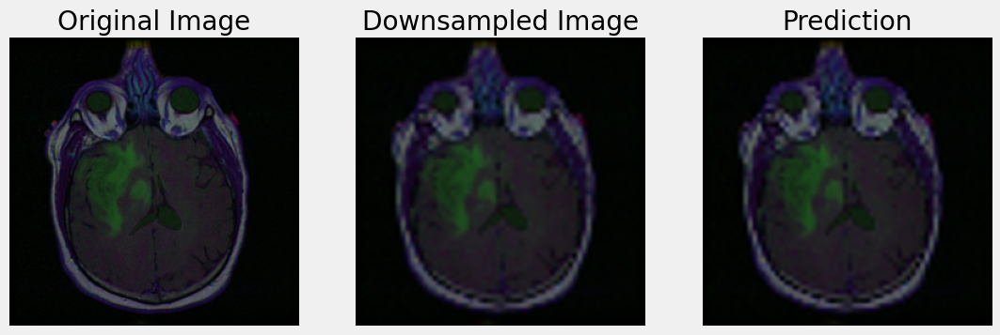

1/1 [==============================] - 0s 26ms/step


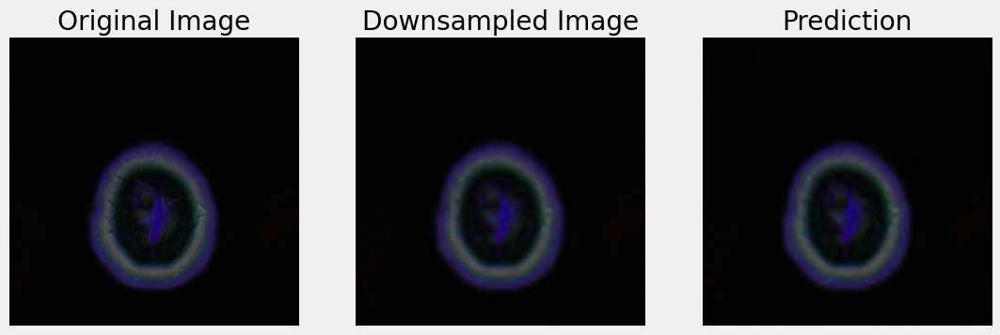

1/1 [==============================] - 0s 19ms/step


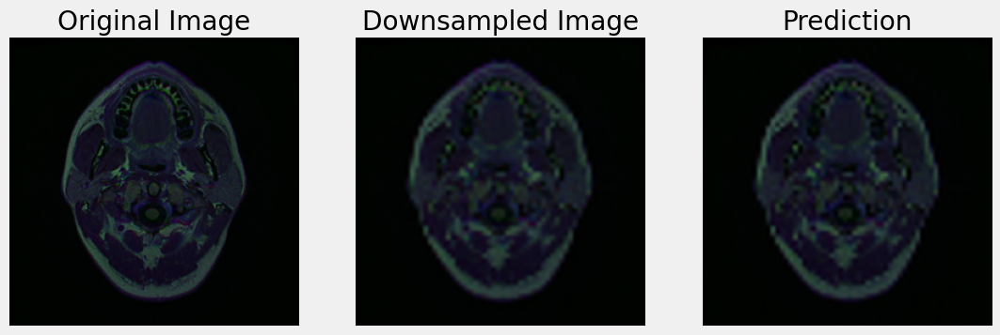

1/1 [==============================] - 0s 23ms/step


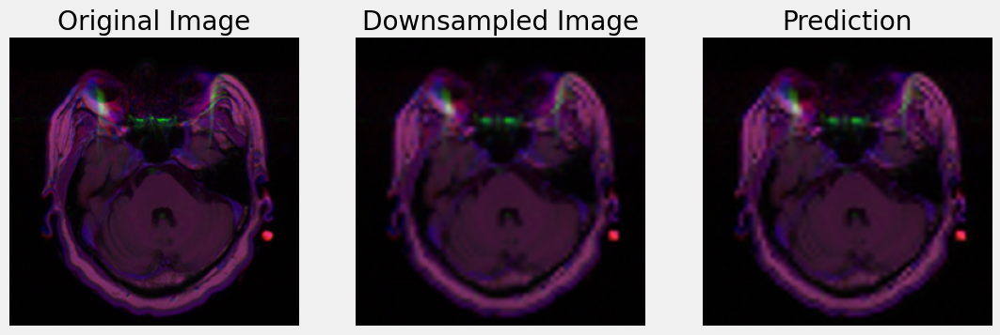

1/1 [==============================] - 0s 19ms/step


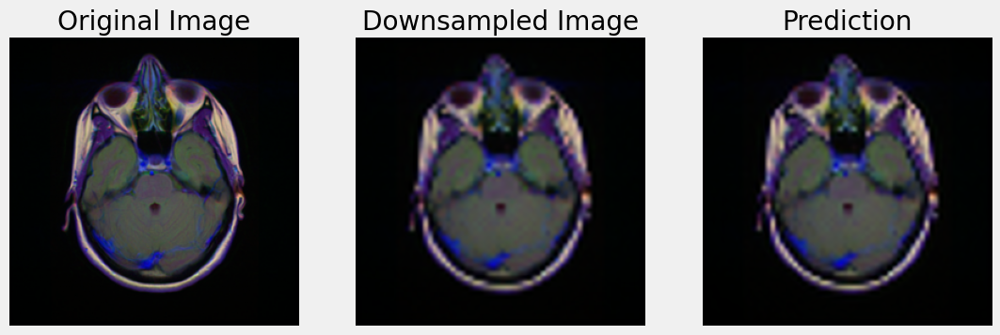

1/1 [==============================] - 0s 22ms/step


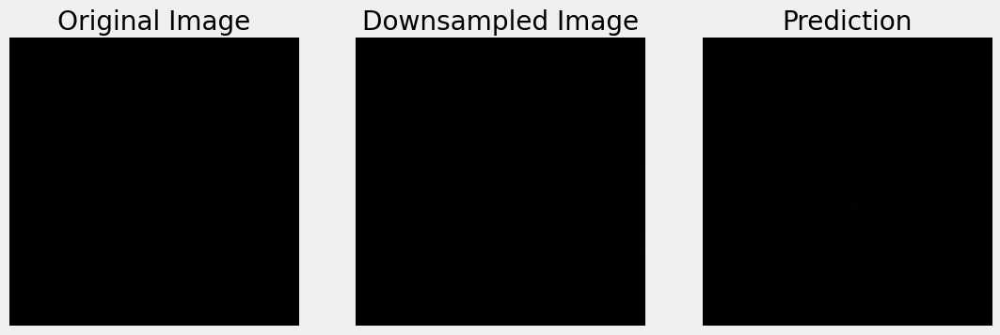

1/1 [==============================] - 0s 19ms/step


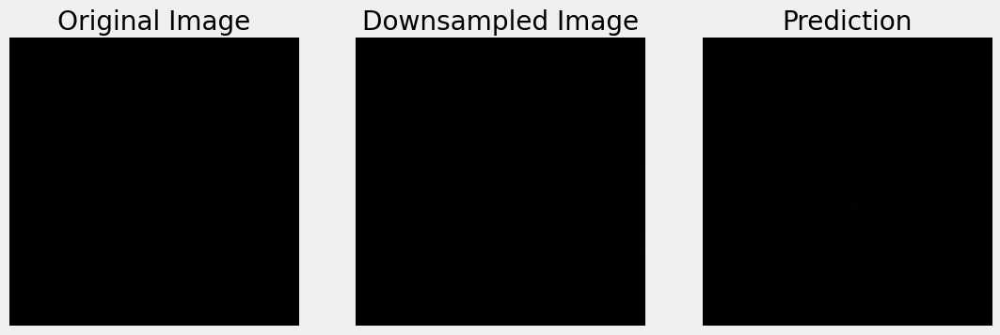

In [24]:
def downsample_image(image):
    lr = tf.image.resize(image, (64, 64))
    lr = tf.image.resize(lr, (256, 256), method=tf.image.ResizeMethod.BICUBIC)
    return lr

for _ in range(10):
    index = np.random.randint(1, len(test_df.index))
    img_path = test_df.iloc[index]['images_paths']
    img = Image.open(img_path)
    img_array = np.array(img) / 255

    lr = np.array([downsample_image(img_array).numpy()])
    predicted_img = SRCNN_915.predict(lr)

    plt.figure(figsize=(12, 12))
    
    plt.subplot(1, 3, 1)
    plt.imshow(np.squeeze(img_array))
    plt.axis('off')
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(np.squeeze(lr))
    plt.axis('off')
    plt.title('Downsampled Image')

    plt.subplot(1, 3, 3)
    plt.imshow(np.squeeze(predicted_img))
    plt.title('Prediction')
    plt.axis('off')
    
    plt.show()

# Tumor segmentation (Improved)

## Load new data

In [33]:
# create normalized image generator
def create_gens(df, aug_dict):
    img_size = (256, 256)
    batch_size = 32

    img_gen = ImageDataGenerator(**aug_dict)
    msk_gen = ImageDataGenerator(**aug_dict)

    image_gen = img_gen.flow_from_dataframe(df, x_col='images_paths', class_mode=None, color_mode='rgb', target_size=img_size,
                                            batch_size=batch_size, save_to_dir=None, save_prefix='image', seed=1)
    mask_gen = msk_gen.flow_from_dataframe(df, x_col='masks_paths', class_mode=None, color_mode='grayscale', target_size=img_size,
                                            batch_size=batch_size, save_to_dir=None, save_prefix= 'mask', seed=1)
    gen = zip(image_gen, mask_gen)

    for (img, msk) in gen:
        img = img / 255
        # improve the image
        predicted_img = SRCNN_915.predict(img)
        msk = msk / 255
        msk[msk > 0.5] = 1
        msk[msk <= 0.5] = 0

        yield (predicted_img, msk)

In [34]:
data_dir = './lgg-mri-segmentation/kaggle_3m'

df = create_df(data_dir)
train_df, valid_df, test_df = split_df(df)

# data augmentation
tr_aug_dict = dict(rotation_range=0.2,
                            width_shift_range=0.05,
                            height_shift_range=0.05,
                            shear_range=0.05,
                            zoom_range=0.05,
                            horizontal_flip=True,
                            fill_mode='nearest')

train_gen = create_gens(train_df, aug_dict=tr_aug_dict)
valid_gen = create_gens(valid_df, aug_dict={})
test_gen = create_gens(test_df, aug_dict={})

## Build the model

In [35]:
# create the model
model = unet_model()
model.compile(Adamax(),
              loss=dice_loss,
              metrics=['accuracy', iou_coef, dice_coef])

## Train

In [36]:
epochs = 3 # 100
batch_size = 256 # 64

# learning rate schedule
def lr_schedule(epoch):
    lr = 0.001
    if epoch > 5:
        lr *= 0.1
    return lr

callbacks = [ModelCheckpoint('unet_improved.hdf5', verbose=0, save_best_only=True),
             LearningRateScheduler(lr_schedule),
             EarlyStopping(patience=3)]

# train loop
history = model.fit(train_gen,
                    steps_per_epoch=math.ceil(len(train_df) / batch_size),
                    epochs=epochs,
                    verbose=1,
                    callbacks=callbacks,
                    validation_data=valid_gen,
                    validation_steps=math.ceil(len(valid_df) / batch_size))

Found 3143 validated image filenames.
Found 3143 validated image filenames.
1/1 [==============================] - 0s 32ms/step
Epoch 1/3
13/13 [==============================] - ETA: 0s - loss: -0.0578 - accuracy: 0.8371 - iou_coef: 0.0300 - dice_coef: 0.0578 Found 393 validated image filenames.
Found 393 validated image filenames.
13/13 [==============================] - 357s 26s/step - loss: -0.0578 - accuracy: 0.8371 - iou_coef: 0.0300 - dice_coef: 0.0578 - val_loss: -0.0506 - val_accuracy: 0.7798 - val_iou_coef: 0.0261 - val_dice_coef: 0.0506 - lr: 0.0010
Epoch 2/3
13/13 [==============================] - 323s 27s/step - loss: -0.1113 - accuracy: 0.9424 - iou_coef: 0.0593 - dice_coef: 0.1113 - val_loss: -0.0311 - val_accuracy: 0.9467 - val_iou_coef: 0.0158 - val_dice_coef: 0.0311 - lr: 0.0010
Epoch 3/3
13/13 [==============================] - 324s 27s/step - loss: -0.1124 - accuracy: 0.9679 - iou_coef: 0.0604 - dice_coef: 0.1124 - val_loss: -0.0396 - val_accuracy: 0.9822 - val_iou

In [37]:
# plot history of accuracy and losses
def plot_training(hist):
    tr_acc = hist.history['accuracy']
    tr_iou = hist.history['iou_coef']
    tr_dice = hist.history['dice_coef']
    tr_loss = hist.history['loss']

    val_acc = hist.history['val_accuracy']
    val_iou = hist.history['val_iou_coef']
    val_dice = hist.history['val_dice_coef']
    val_loss = hist.history['val_loss']

    index_acc = np.argmax(val_acc)
    acc_highest = val_acc[index_acc]
    index_iou = np.argmax(iou_coef)
    iou_highest = val_iou[index_iou]
    index_dice = np.argmax(dice_coef)
    dice_highest = val_dice[index_dice]
    index_loss = np.argmin(val_loss)
    val_lowest = val_loss[index_loss]

    Epochs = [i+1 for i in range(len(tr_acc))]

    acc_label = f'best epoch = {str(index_acc + 1)}'
    iou_label = f'best epoch = {str(index_iou + 1)}'
    dice_label = f'best epoch = {str(index_dice + 1)}'
    loss_label = f'best epoch = {str(index_loss + 1)}'

    plt.figure(figsize= (20, 20))
    plt.style.use('fivethirtyeight')

    # training accuracy
    plt.subplot(2, 2, 1)
    plt.plot(Epochs, tr_acc, 'r', label='Training Accuracy')
    plt.plot(Epochs, val_acc, 'g', label='Validation Accuracy')
    plt.scatter(index_acc + 1, acc_highest, s=150, c='blue', label=acc_label)
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # training iou
    plt.subplot(2, 2, 2)
    plt.plot(Epochs, tr_iou, 'r', label='Training IoU')
    plt.plot(Epochs, val_iou, 'g', label='Validation IoU')
    plt.scatter(index_iou + 1, iou_highest, s=150, c='blue', label=iou_label)
    plt.title('Training and Validation IoU Coefficient')
    plt.xlabel('Epochs')
    plt.ylabel('IoU')
    plt.legend()

    # training dice
    plt.subplot(2, 2, 3)
    plt.plot(Epochs, tr_dice, 'r', label='Training Dice')
    plt.plot(Epochs, val_dice, 'g', label='Validation Dice')
    plt.scatter(index_dice + 1, dice_highest, s=150, c='blue', label=dice_label)
    plt.title('Training and Validation Dice Coefficient')
    plt.xlabel('Epochs')
    plt.ylabel('Dice')
    plt.legend()

    # training loss
    plt.subplot(2, 2, 4)
    plt.plot(Epochs, tr_loss, 'r', label='Training loss')
    plt.plot(Epochs, val_loss, 'g', label='Validation loss')
    plt.scatter(index_loss + 1, val_lowest, s=150, c='blue', label=loss_label)
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout
    plt.show()

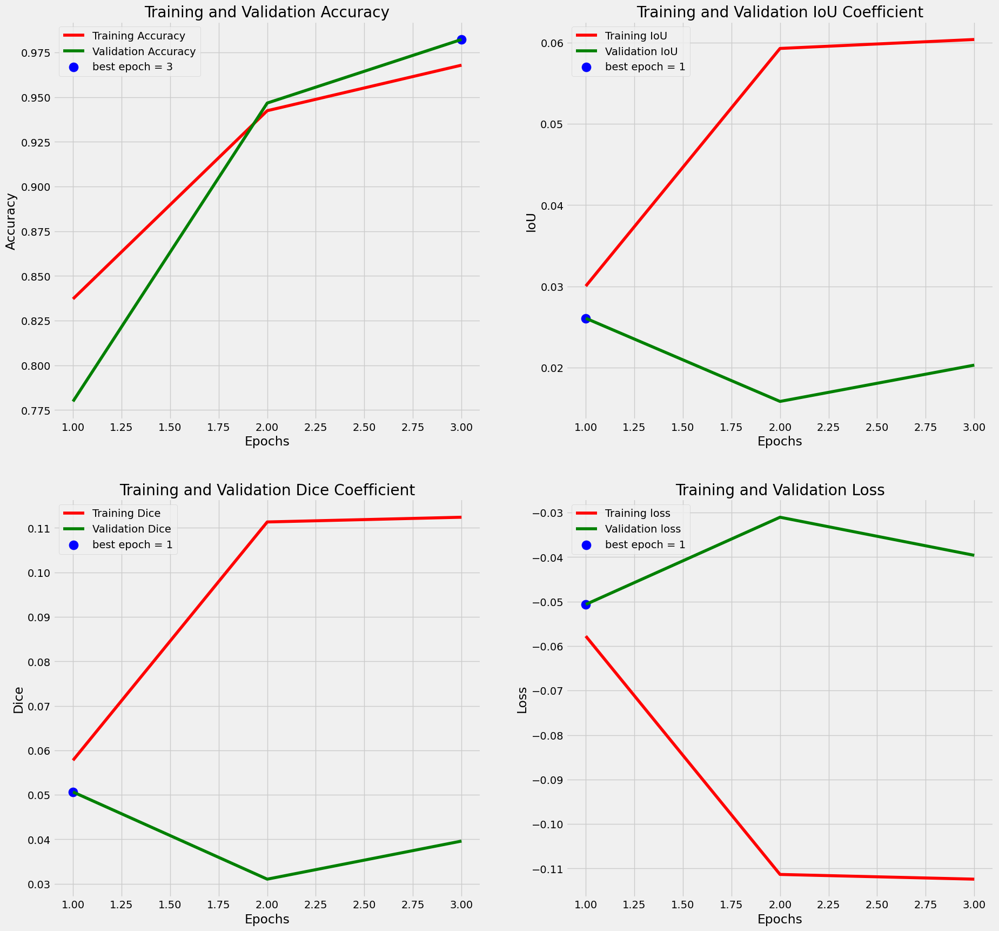

In [38]:
plot_training(history)

## Evaluation

In [39]:
test_steps = math.ceil(len(test_df) / batch_size)
test_score = model.evaluate(test_gen, steps=test_steps, verbose=1)

print("Test Loss:", test_score[0])
print("Test Accuracy:", test_score[1])
print("Test IoU:", test_score[2])
print("Test Dice:", test_score[3])

Found 393 validated image filenames.
Found 393 validated image filenames.
1/1 [==============================] - 0s 31ms/step
Test Loss: -0.02432085946202278
Test Accuracy: 0.9888343811035156
Test IoU: 0.012379899621009827
Test Dice: 0.02432085946202278


## Prediction

1/1 [==============================] - 0s 323ms/step


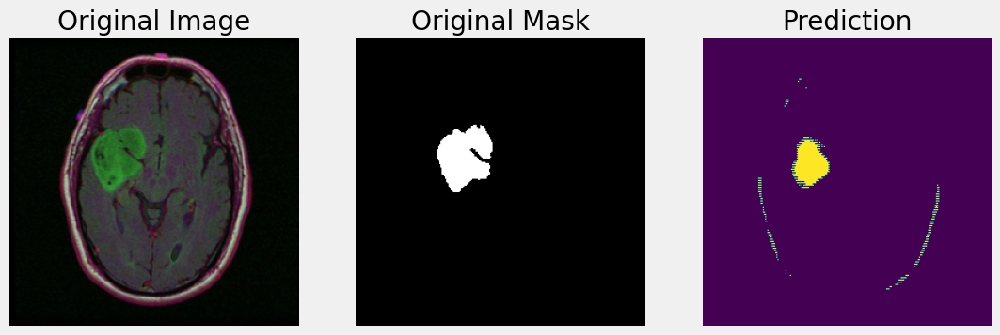

1/1 [==============================] - 0s 23ms/step


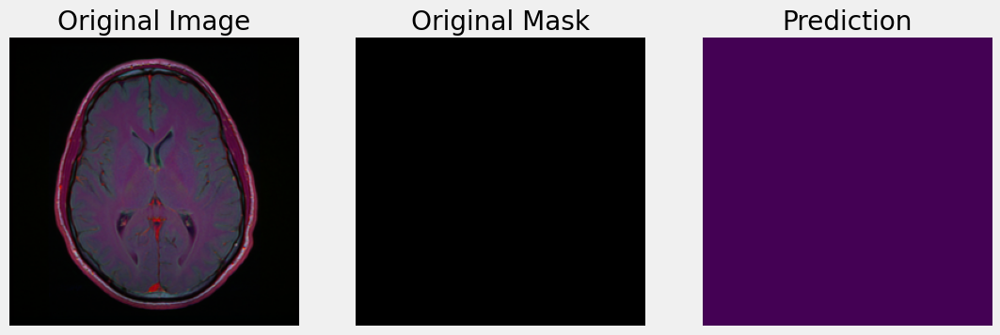

1/1 [==============================] - 0s 21ms/step


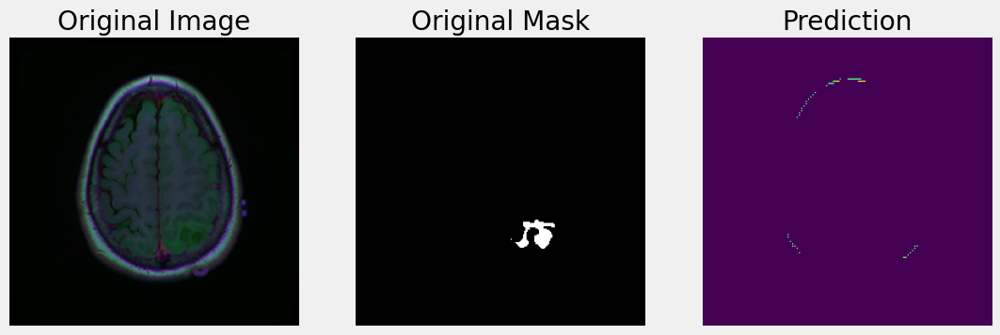

1/1 [==============================] - 0s 22ms/step


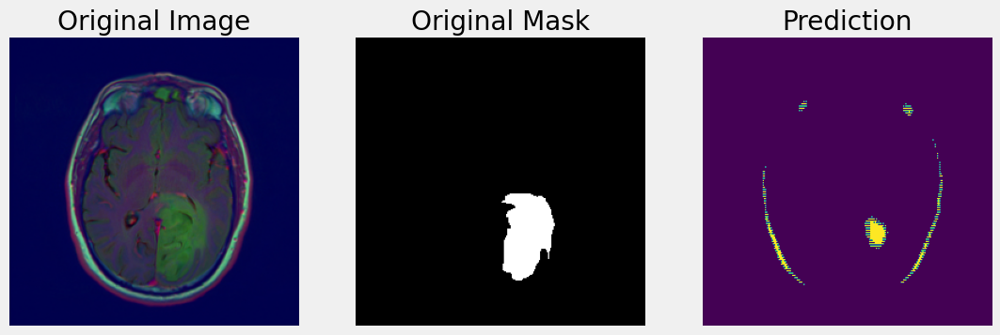

1/1 [==============================] - 0s 22ms/step


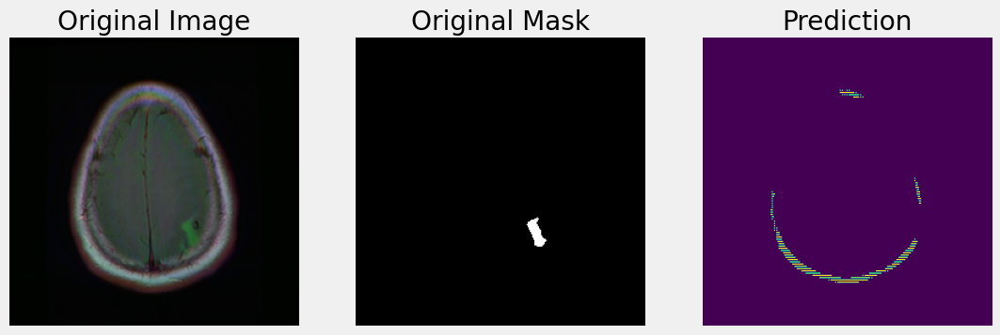

1/1 [==============================] - 0s 21ms/step


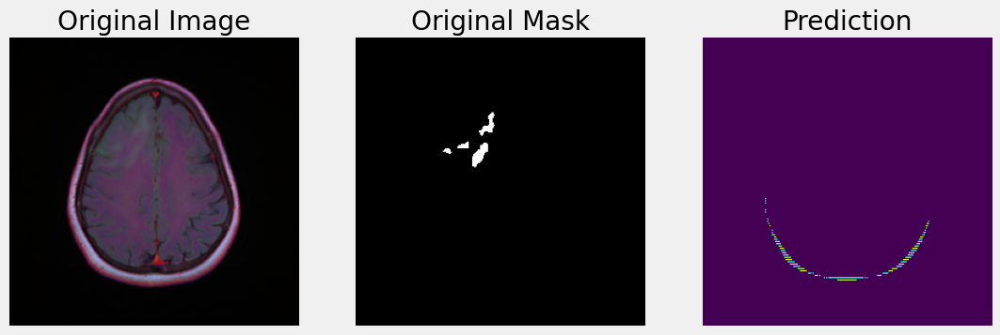

1/1 [==============================] - 0s 21ms/step


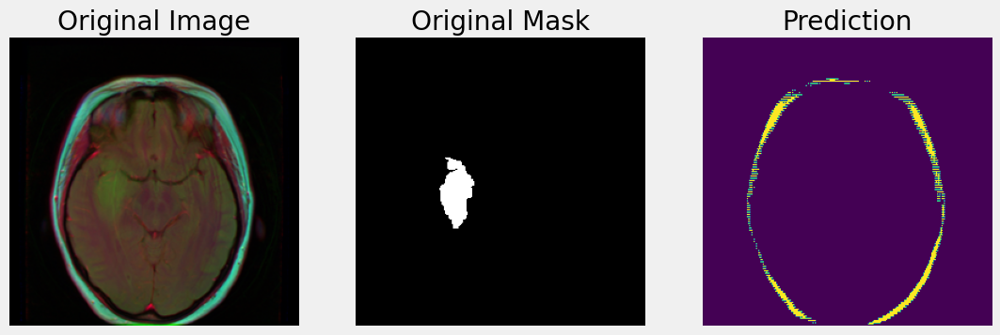

1/1 [==============================] - 0s 21ms/step


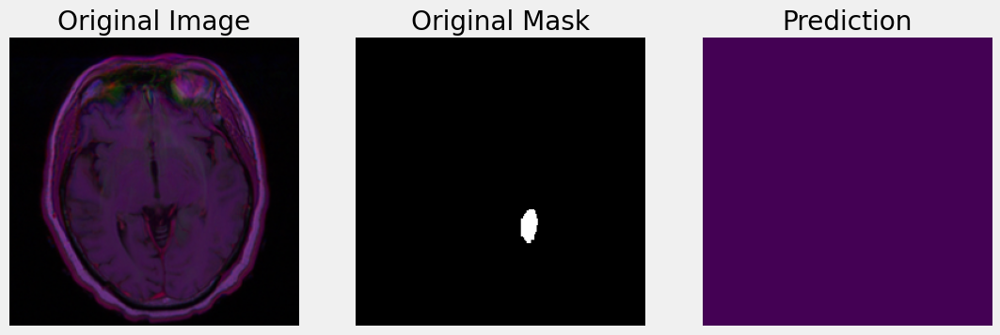

1/1 [==============================] - 0s 20ms/step


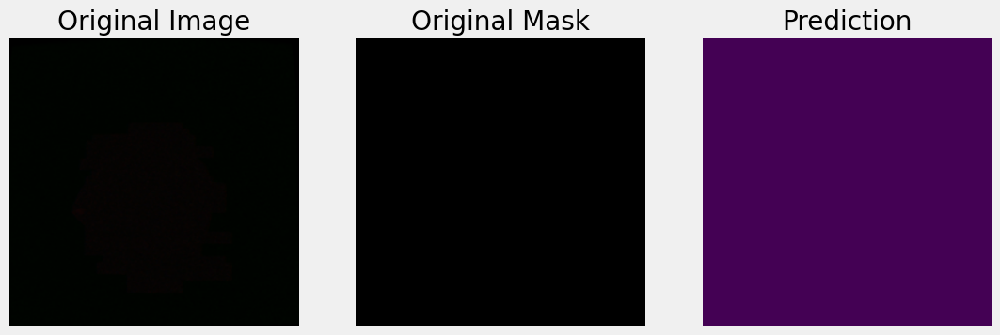

1/1 [==============================] - 0s 21ms/step


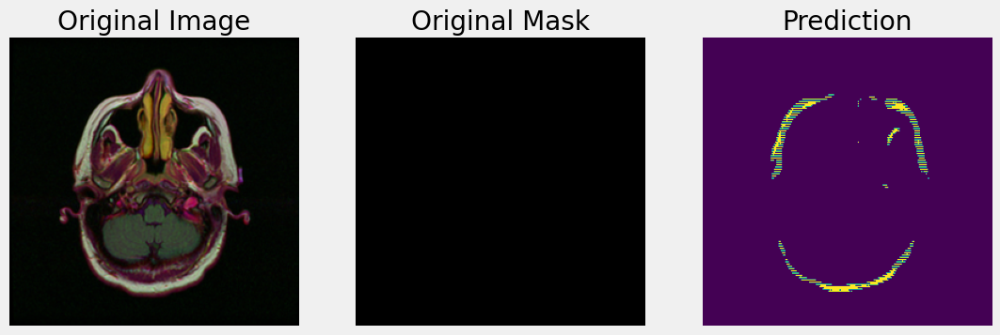

In [40]:
for _ in range(10):
    index = np.random.randint(1, len(test_df.index))
    img = cv2.imread(test_df['images_paths'].iloc[index])
    img = cv2.resize(img, (256, 256))
    img = img / 255
    img = img[np.newaxis, :, :, : ]

    predicted_img = model.predict(img)

    plt.figure(figsize=(12, 12))
    
    plt.subplot(1, 3, 1)
    plt.imshow(np.squeeze(img))
    plt.axis('off')
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(np.squeeze(cv2.imread(test_df['masks_paths'].iloc[index])))
    plt.axis('off')
    plt.title('Original Mask')

    plt.subplot(1, 3, 3)
    plt.imshow(np.squeeze(predicted_img) > 0.5 )
    plt.title('Prediction')
    plt.axis('off')
    
    plt.show()